In [145]:
using Pkg
Pkg.activate("../..")
using Plots, ForwardDiff, SymbolicNumericIntegration, SymPy
using LinearAlgebra, DifferentialEquations
include("../../julia_chaos/src/tools.jl")
using .ChaosTools

  Activating project at `~/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos`


## Intro

We have seen a lot about continuous systems (i.e differential equations). But almost equally important we must take care of discrete systems (namely, difference equations). In this section we will see how to study discrete systems. We will start with a simple example of a discrete system and then we will see how to study it.

A trick I new a long time ago (exactly when I got my first scientific calculator) is to play around, you assign a variable a value between 0 and 1. And invent a sort of update rule. For example, lets play with the following rule:

$$x_{n+1} = x_{n}^2-1$$

And so, we can keep the sequence:

┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/01.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/01.gif")
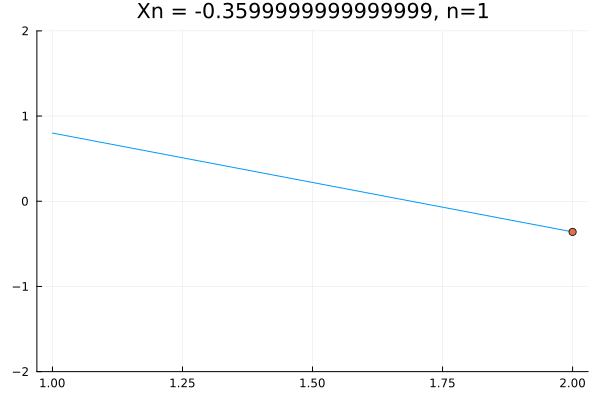

In [124]:
x = [0.8]
anim = @animate for n = 1:1:20
    xi = (x[end]^2-1)
    push!(x, xi)
    Plots.plot(x, legend = false, ylims = (-2, 2), title="Xn = $xi, n=$n")
    Plots.scatter!([n+1], [xi], label = "")
end
gif(anim, "01.gif", fps = 5)

In the context of discrete systems, the set $\{x_n\}_{n=1}^N$ is known as the **orbit** of the system. And the rule $x_{n+1} = f(x_n)$ is known as the **iterative map**, which is a smooth function from $\mathbb{R}$ to itself. In this case, the map is $f(x) = x^2-1$.


## Fixed points and cobwebs

Lets first suppose that $x^* = f(x^*)$. This is known as a **fixed point**, other way to look at it is the last point of the orbit, as $n\to \infty$.

The stability of fixed point is given by looking at $x_n = x^* + \eta_n$, where $\eta_n$ is a perturbation. The main idea is to search wether the orbit is attracted (in the case of stability) or repelled from $x^*$.

Do you remember the linearization of ODEs we did for systems, we can repeat a similar idea by expanding here:

$$x_{n+1} = f(x_n) = f(x^* + \eta_n) = f(x^*) + f'(x^*)\eta_n + \mathcal{O}(\eta_n^2)$$

which gives for a fixed point the linearized:

$$\eta_{n+1} =f'(x^*)\eta_n + \mathcal{O}(\eta_n^2)$$

The map is linearizable if it is possible to neglect the second order term. Since the theorist are lazy, they want a similar idea to the one in continuos systems, defining a *eigen value* or (also known as **multiplier**) $\lambda$:

$$\lambda = f'(x^*)$$

So that a linear system is simply solvable by doing $\eta_{n+1} = \lambda \eta_n$. Theoretically, by studying the multiplier we can determine the stability of the fixed point:

- If $\|\lambda\| < 1$, the fixed point is linearly stable.
- Otherwise, if $\|\lambda\| > 1$, the fixed point is unstable.
- Finally, if $\|\lambda\| = 1$, the case the case is called **marginal**, and really nothing can be said.

Other ways of studying the stability is to look at the **cobweb**. The cobweb is a graphical representation of the orbit. The idea is to plot the orbit and the tangent line at each point. The tangent line is the linearization of the map at that point, as we'll see in the following example:

---

Example: $x_{n+1} = \sin(x)$.

Let us begin by searching the multiplier of the point $x^* = 0$. We have:

$$\lambda = f'(x^*) = \cos(0) = 1$$

So, the multiplier is $1$, and the fixed point is **marginal**. The cobweb is:

┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/02.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/02.gif")
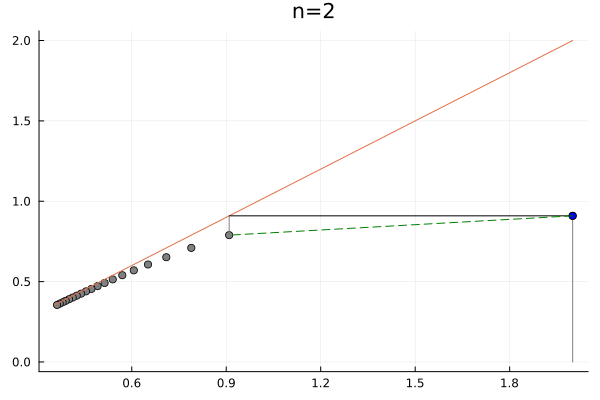

In [89]:
ns = 1:1:20
xs = [2.]
for n in ns
    push!(xs, sin(xs[end]))
end
xp = xs[2:end]
p1 = Plots.scatter(xs[1:end-1], xp, legend = false, color=:grey)
Plots.plot!(xs, xs, label = "")
Plots.plot!([xs[1], xs[1]], [0, xp[1]], label = "", color=:grey)
anim = @animate for n in 2:length(xs)-2
    Plots.scatter!([xs[n-1]], [xp[n-1]], label = "", color=:blue)
    Plots.plot!([xs[n-1], xs[n]], [xs[n], xs[n]], label = "", color=:black, title="n=$n")
    Plots.plot!([xs[n - 1], xs[n]], [xp[n-1], xp[n]], label = "", color=:green, linestyle=:dash)
    Plots.plot!([xs[n], xs[n]], [xp[n-1], xp[n]], label = "", color=:grey)
end
gif(anim, "02.gif", fps = 5)

This is a very simple example, but it is important to see how the cobweb is constructed. The tangent line is the linearization of the map at that point. The tangent line is the line that passes through the point $(x_n, f(x_n))$ and has slope $f'(x_n)$. The tangent line is the line that passes through the point $(x_n, f(x_n))$ and has slope $f'(x_n)$.

We can note that, if we were to change the function $f$ slightly, the result would be different. For example, if we change the function to $f(x) = \cos(x) + \epsilon$, we would get:

attempt to save state beyond implementation limit
attempt to save state beyond implementation limit


┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/03.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/03.gif")
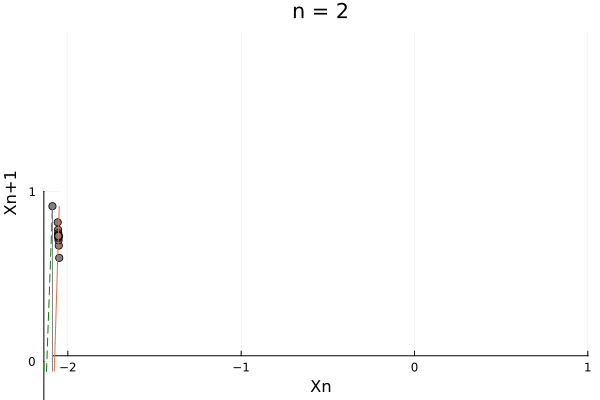

In [96]:
ns = 1:1:20
xs = [-2.]
for n in ns
    push!(xs, cos(xs[end]))
end
xp = xs[2:end]
p1 = Plots.scatter(xs[1:end-1], xp, legend = false, color=:grey, xlabel="Xn", ylabel="Xn+1")
Plots.plot!(xs, xs, label = "")
Plots.plot!([xs[1], xs[1]], [0, xp[1]], label = "", color=:grey)
anim = @animate for n in 2:length(xs)-2
    Plots.scatter!([xs[n-1]], [xp[n-1]], label = "", color=:blue)
    Plots.plot!([xs[n-1], xs[n]], [xs[n], xs[n]], label = "", color=:black, title="n = $n")
    Plots.plot!([xs[n - 1], xs[n]], [xp[n-1], xp[n]], label = "", color=:green, linestyle=:dash)
    Plots.plot!([xs[n], xs[n]], [xp[n-1], xp[n]], label = "", color=:grey)
end
gif(anim, "03.gif", fps = 5)

---

### Logistic maps

The logistic map is a discrete map that is very important in the study of chaos. It was initially introduced to show how complex a simple system can be. The logistic map is defined as:

$$x_{n+1} = r x_n (1-x_n)$$

where $r$ is a parameter. The logistic map is a very simple map, but it is very interesting for the study of step-wise grow. The logistic map has a fixed point at $x^* = 0$ and $x^* = 1$, as we will see:

┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/04.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/04.gif")
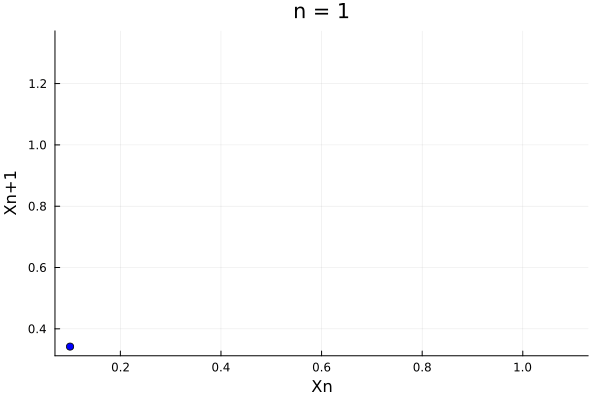

In [109]:
ns = 1:1:200
r = 3.8
xs = [0.1]
Plots.plot(xlabel="Xn", ylabel="Xn+1", legend = false, color=:grey)
anim = @animate for n in ns
    xi = xs[n]
    xip = r*xi*(1-xi)
    Plots.scatter!([xi], [xip], label = "", color=:blue, title="n = $n")
    push!(xs, xip)
end

gif(anim, "04.gif", fps = 10)

Here, the behavior of the system is hugely determined by the parameter $r$, as the map falls back to itself only if $r < 4$. 

A population model based in this shows us that if a population has a growth rate $r$, the population will grow exponentially if $r > 1$, but saturate shortly. If $r < 1$, the population will die out:

attempt to save state beyond implementation limit
attempt to save state beyond implementation limit


┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/05.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/05.gif")
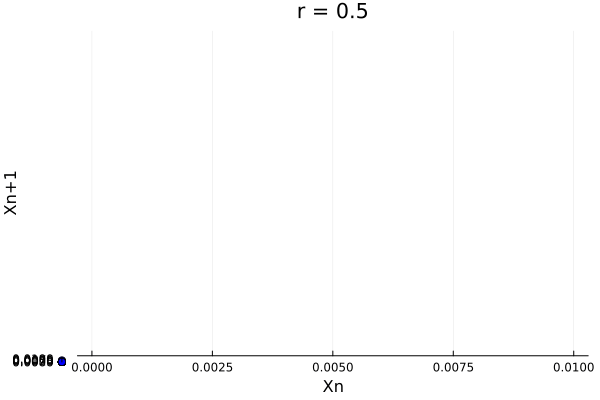

In [120]:
function logistic_map(x0, r; N=200)
    xs = [x0]
    @fastmath for n in 1:N
        xi = xs[n]
        xip = r*xi*(1-xi)
        push!(xs, xip)
    end
    return xs[1:end-1], xs[2:end]
end
anim = @animate for r in 0.5:0.01:4.0
    xs, xp = logistic_map(0.01, r)
    Plots.scatter(xs, xp, label = "", color=:blue, title="r = $r")
    Plots.plot!(xs, xs, label = "", color=:black, xlabel="Xn", ylabel="Xn+1", legend = false)
end
gif(anim, "05.gif", fps = 10)

But of course, it is easier to see this complex behavior in the actual population of the system:

┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/06.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/06.gif")
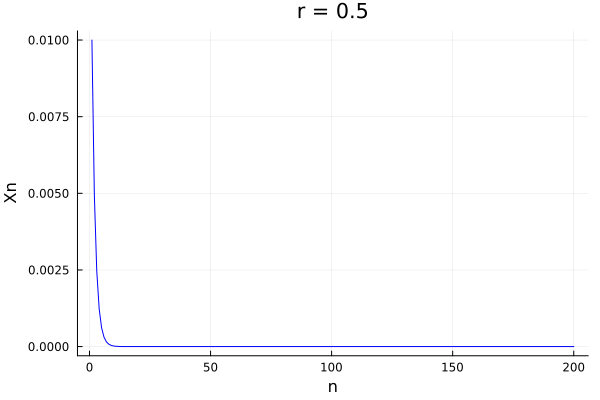

In [134]:
anim = @animate for r in 0.5:0.01:4.0
    xs, xp = logistic_map(0.01, r)
    Plots.plot(xs, label = "", color=:blue, title="r = $r", xlabel="n", ylabel="Xn")
end
gif(anim, "06.gif", fps = 10)

In fact we see that for a given $r$, the system starts having cycles which repeat themselves. This is known as **period doubling**. The period doubling is a very important phenomenon in the study of chaos. The period doubling is a phenomenon that happens when the system has a bifurcation, and the system starts having cycles of different periods. 

In fact all of it starts at $r=3$ and is a sequence that goes up to $r_\infty = 3.569946...$.

### Analysis of the logistic map

To inspect more carefully what goes on when the system has a bifurcation, we can look at the very famous **orbit diagram**, which plots the attractor as a function of the parameter $r$. Let us plot the orbit diagram for the logistic map (be careful to understand the code):

┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/07.gif
└ @ Plots /home/jose/.julia/packages/Plots/M4dfL/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/07.gif")
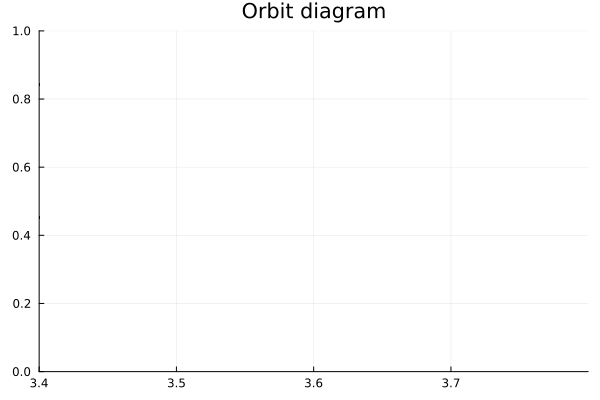

In [144]:
Plots.plot(title="Orbit diagram")
anim7 = @animate for r in 3.4:0.01:3.8, k in 1:50
    x_i = rand()
    xs, xp = logistic_map(x_i, r, N=400)
    Plots.scatter!(repeat([r], length(xs[300:end])) , [xs[300:end]], label = "", color=:blue, markersize=0.5, xlims=(3.4, 3.8), ylims=(0, 1))
end
gif(anim7, "07.gif", fps = 50)

But there is something much more incredible!, this system repeats in miniature, so we can zoom in and see the same behavior of doubling of periods each time before $r_\infty$, and then just becoming chaotic.In fact, this window three period shows a variety of strange phenomena, such as the intermittency of chaos in the doubling window:


In [143]:
r = 3.8284
xs, xp = logistic_map(0.1, r, N=120)
Plots.plot(xs, label = "", color=:blue, title="r = $r", xlabel="n", ylabel="Xn")
Plots.savefig("08.png")

"/home/jose/Documents/STUDY/Bsc/ComplexSystems/blog/JuliaChaos/entries/03_three_chaos/08.png"

## Liapunov exponent

As we saw in the previous chapter, Liapunov exponents allow us to easily estimate numerically how chaotic systems (just like our logistic map), react to small perturbations. The idea is to look at the growth of the perturbation $\delta_n$ as n increases, whose growth is given by:

$$\|\delta_n\| = \|\delta_0\| \cdot e^{\lambda n}$$

where $\lambda$ is the Liapunov exponent. By lookining algebraically at the system, we can derive that:

$$\lambda = \frac{\ln \| \delta_n\| - \ln \| \delta_0\|}{n}$$

$$\lambda = \ln\|(f^n)'|_{x_0}\ \|$$

$$\therefore \ \lambda \approx \frac{1}{n}\cdot \sum_{i=0}^{n-1} \ln(f')$$

But as we are *numerically* computing the Liapunov exponent, we can approximate the actual Liapunov exponent by:

$$\therefore \ \lambda = \lim_{n \to \infty} \frac{1}{n}\cdot \sum_{i=0}^{n-1} \ln(f')$$

Again, we can use this approach to figure out if a point is stable or not. If $\lambda < 0$, the point is stable, if $\lambda > 0$, we are talking about a chaotic attractor.

### Universality

Incredibly, while studying other maps, people started noticing that factors such as convergence rate:

$$\delta = \lim_{n \to \infty} \frac{x_n - x_{n-1}}{x_{n+1} - x_n} \approx 4.669$$

repeat themselves in different scenarios. In fact, is is a mathematical constant telling how often in the gif above, two branches dramatically split. Nowadays, this is known as the **Feigenbaum constant**, which is very common in physical systems such as phase transitions in physical systems.

But, how can this be true.... a continuous system behaving like a simple math, it all goes down to a model of complex behavior.

### Renormalization

The idea of renormalization is to study the behavior of a system by looking at the behavior of the system in a small region, which is simply the nature of all these fractal systems. So the main idea is, if we have the function $f(x, r)$ nho undergoes a period doubling at $r = r_0$, we can study the behavior of the system in a small region around $r_0$, and by rescaling (both $x$ and $f$) repeat the same procedure for $r_n$.

The normalization factor you shall use is another constant derived by Feigenbaum, which is:

$$\alpha = \lim_{n \to \infty} \frac{d_n}{d_{n+1}} \approx -2.5029$$

so, the behavior of $x_2 = f^2(x, r)$ is: $$\alpha f^2(\frac{x}{\alpha}, r)$$

Numerically, we can call a new function $g_0(x)$ the universal function of the map, which is:

$$g_0(x) = \lim_{n \to \infty} \alpha^n f^{(2^n)}(x/\alpha^n, R_n)$$

and in fact, $g_0$ is exactly the same for all $f$ with a quadratic maximum. The fractality of the systems is also self evident, as the function $g_0$ is a fractal function:

$$g(x) = \alpha g^2\Big(\frac{x}{\alpha}\Big)$$

## Conclusion

In this entry, we saw how powerful our previously previous techniques were for the study of a hole new field (one dimensional maps), and more importantly, we saw that apart of going the other way around (understanding maps allow to understand ODEs); almost all maps can be studied all at once... This is an amazing result, and it is the reason why we can study the behavior of complex systems with such a simple tool.

**Reference**: [*Nonlinear Dynamics and Chaos*](https://www.stevenstrogatz.com/books/nonlinear-dynamics-and-chaos-with-applications-to-physics-biology-chemistry-and-engineering), by Steven Strogatz.